In [ ]:
!pip install kaggle

In [ ]:
import kaggle
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import keras
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import applications
from keras.models import Sequential, load_model
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dense, Dropout
from keras.preprocessing import image
from tensorflow.keras.utils import image_dataset_from_directory
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.utils.class_weight import compute_class_weight
import seaborn as sns
from sklearn.metrics import confusion_matrix
from matplotlib import cm
from tensorflow.keras.models import Model

: 

In [ ]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download -d paultimothymooney/chest-xray-pneumonia
! unzip chest-xray-pneumonia.zip

Streaming output truncated to the last 5000 lines.
  inflating: chest_xray/train/NORMAL/IM-0435-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0435-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001-0002.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0438-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001-0002.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0440-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0441-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0442-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0444-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0445-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0446-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0447-0001.jpeg  
  inflating:

In [ ]:
TRAINING_DATA_PATH = "./chest_xray/train/"
TESTING_DATA_PATH = "./chest_xray/test/"
VALIDATION_DATA_PATH = "./chest_xray/val/"
NUM_FT_EPOCHS = 6
NUM_T_EPOCHS = 15
BATCH_SIZE = 32
IMG_HEIGHT =299
IMG_WIDTH = 299

In [ ]:
#from google.colab import drive
#drive.mount('/content/gdrive')


In [ ]:
gen = ImageDataGenerator(rescale = 1./255,
                         zoom_range = 0.05,
                         width_shift_range = 0.05,
                         height_shift_range = 0.05,
                         brightness_range = [0.95,1.05])

train_data_gen= gen.flow_from_directory(
    directory = TRAINING_DATA_PATH ,#"/content/gdrive/My Drive/chest_xray_images/train/",
    color_mode = "rgb",
    target_size = (IMG_HEIGHT, IMG_WIDTH),
    class_mode = "categorical",
    batch_size = BATCH_SIZE,
    shuffle = True,
    seed = 42)

Found 5216 images belonging to 2 classes.


In [ ]:
test_gen = ImageDataGenerator(rescale = 1./255.)
valid_data_gen = test_gen.flow_from_directory(
    directory   = VALIDATION_DATA_PATH, #"/content/gdrive/My Drive/chest_xray_images/val/",
    color_mode  = "rgb",
    target_size = (IMG_HEIGHT, IMG_WIDTH),
    class_mode  = "categorical",
    batch_size  = BATCH_SIZE,
    shuffle     = False,
    seed        = 42)

Found 16 images belonging to 2 classes.


In [ ]:
test_data_gen= test_gen.flow_from_directory(
    directory   = TESTING_DATA_PATH, #"/content/gdrive/My Drive/chest_xray_images/test/",
    color_mode  = "rgb",
    target_size = (IMG_HEIGHT, IMG_WIDTH),
    class_mode  = "categorical",
    batch_size  = BATCH_SIZE,
    shuffle     = False,
    seed        = 42)

Found 624 images belonging to 2 classes.


In [ ]:
var = train_data_gen.class_indices
class_names = list(var.keys())
freq = np.unique(train_data_gen.classes, return_counts=True)

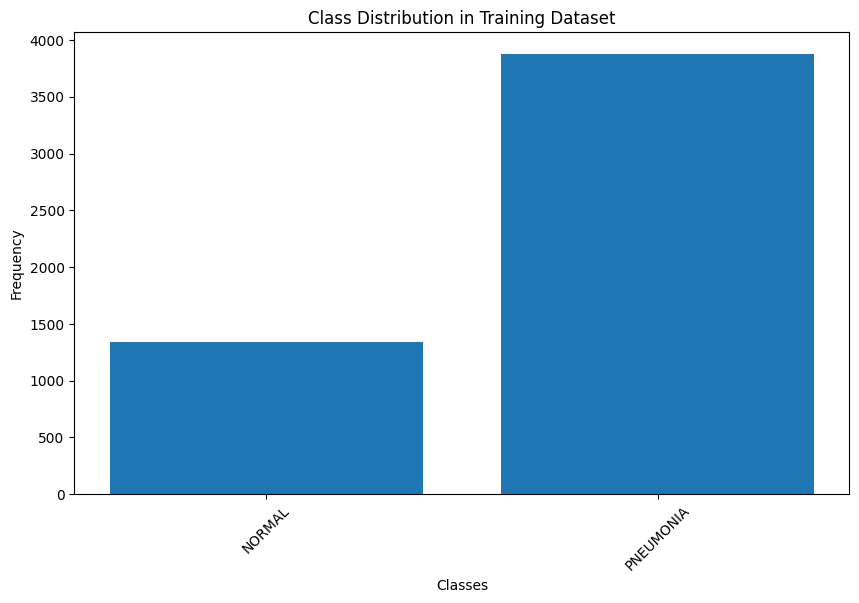

In [ ]:
#plt.title("Trainning dataset")
plt.figure(figsize=(10, 6))
plt.bar(class_names, freq[1])
plt.title("Class Distribution in Training Dataset")
plt.xlabel("Classes")
plt.ylabel("Frequency")
plt.xticks(rotation=45)
plt.show()

In [ ]:
# clearly an umbalanced data set, so some class weights
cls_wg = compute_class_weight(class_weight = "balanced", classes= np.unique(train_data_gen.classes), y= train_data_gen.classes)
cls_wg = dict(zip(np.unique(train_data_gen.classes), cls_wg))

In [ ]:
def draw_img(img, true_labels, predictions = None):
    plt.figure(figsize=[12, 18])
    for i in range(24):
        plt.subplot(6, 4, i+1)
        plt.imshow(img[i])
        plt.axis('off')
        if (predictions is not None):
            plt.title("{}\n {} {:.1f}%".format(class_names[np.argmax(true_labels[i])], class_names[np.argmax(predictions[i])], 100 * np.max(predictions[i])))
        else:
            plt.title(class_names[np.argmax(true_labels[i])])


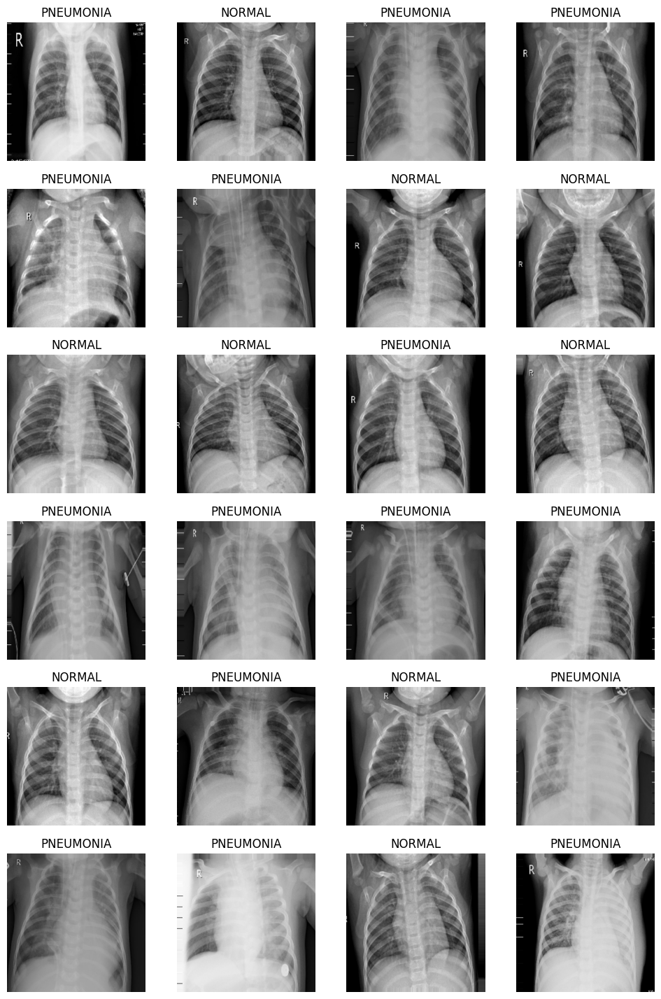

In [ ]:
x,y = next(train_data_gen)
draw_img(x,y)

In [ ]:
def spot_hm(y_true, y_pred, class_names, ax, title):
    c_matrix = confusion_matrix(y_true, y_pred)
    sensitivity = c_matrix[1,1]/(c_matrix[1,0]+c_matrix[1,1])
    specificity = c_matrix[0,0]/(c_matrix[0,0]+c_matrix[0,1])
    new_title = f'{title}\n Sensitivity = {sensitivity:.2f} Specificity = {specificity:.2f}'
    sns.heatmap(c_matrix, annot=True, square=True, xticklabels=class_names, yticklabels=class_names, fmt='d', cmap=plt.cm.Blues, cbar=False, ax=ax)
    ax.set_title(new_title, fontsize = 12)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, ha = "right")
    ax.set_ylabel('True Label', fontsize= 10)
    ax.set_xlabel('Predicted Label', fontsize = 10)

In [ ]:
def grad_hm(image, model, last_conv_layer_name):
    img_array = tf.expand_dims(image, axis=0)
    last_layer_activation = model.layers[-1].activation
    model.layers[-1].activation = None
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]
    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    heatmap = heatmap.numpy()
    heatmap = np.uint8(255 * heatmap)
    j_et = cm.get_cmap("jet")
    j_et_colors = j_et(np.arange(256))[:, :3]
    j_et_heatmap = j_et_colors[heatmap]
    j_et_heatmap = tf.keras.utils.array_to_img(j_et_heatmap)
    j_et_heatmap = j_et_heatmap.resize((img_array[0].shape[1], img_array[0].shape[0]))
    j_et_heatmap = tf.keras.utils.img_to_array(j_et_heatmap)
    s_img = j_et_heatmap * 0.4 + img_array[0] * 255
    s_img = tf.keras.utils.array_to_img(s_img)
    model.layers[-1].activation = last_layer_activation
    return s_img

In [ ]:
# function to plote training history
def plot_history(history):
    # store results
    acuracy = history.history['accuracy']
    v_acuracy = history.history['val_accuracy']
    da_loss = history.history['loss']
    val_da_loss = history.history['val_loss']
    # loss
    plt.subplot(2, 1, 2)
    plt.plot(da_loss, label='Training Loss')
    plt.plot(val_da_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.ylabel('Cross Entropy')
    plt.title(f'Training and Validation Loss. \nTrain Loss: {str(round(da_loss[-1],3))}\nValidation Loss: {str(round(val_da_loss[-1],3))}')
    plt.xlabel('epoch')
    plt.tight_layout(pad=3.0)
    plt.show()
    # accuracy
    plt.figure(figsize=(5, 8))
    plt.rcParams['figure.figsize'] = [8, 4]
    plt.rcParams['font.size'] = 10
    plt.rcParams['axes.grid'] = True
    plt.rcParams['figure.facecolor'] = 'white'
    plt.subplot(2, 1, 1)
    plt.plot(acuracy, label='Training Accuracy')
    plt.plot(v_acuracy, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.ylabel('Accuracy')
    plt.title(f'\nTraining and Validation Accuracy. \nTrain Accuracy: {str(round(acuracy[-1],3))}\nValidation Accuracy: {str(round(v_acuracy[-1],3))}')


In [ ]:
def create_model(base_model):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(128, activation = 'relu')(x)
    x = Dropout(0.4)(x)
    x = Dense(64, activation = 'relu')(x)
    x = Dropout(0.2)(x)
    outputs = Dense(len(class_names), activation='softmax')(x)
    model = Model(base_model.inputs, outputs)
    return model

In [ ]:
def fit_model(model, base_model, epochs, fine_tune = 0):
    early = tf.keras.callbacks.EarlyStopping( patience = 10,
                                              min_delta = 0.001,
                                              restore_best_weights = True)

    print("Unfreezing layers in the base model = ", fine_tune)
    if fine_tune > 0:
        base_model.trainable = True
        for layer in base_model.layers[:-fine_tune]:
            layer.trainable = False
        model.compile(optimizer=tf.keras.optimizers.Adam(1e-5),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
    else:
        base_model.trainable = False
        model.compile(optimizer=tf.keras.optimizers.Adam(),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])

    history = model.fit(train_data_gen,
                        validation_data = valid_data_gen,
                        epochs = epochs,
                        callbacks = [early],
                        class_weight=cls_wg)

    return history

In [ ]:
base_inceeption =tf.keras.applications.InceptionResNetV2(
                     include_top = False,
                     weights = 'imagenet',
                     input_shape = (IMG_HEIGHT, IMG_WIDTH, 3)
                     )
m_inception =create_model(base_inceeption)
history = fit_model(m_inception, base_inceeption, epochs = NUM_T_EPOCHS)

219055592/219055592 [==============================] - 6s 0us/step
Unfreezing layers in the base model =  0
Epoch 1/15
163/163 [==============================] - 2518s 15s/step - loss: 0.3368 - accuracy: 0.8485 - val_loss: 0.2495 - val_accuracy: 0.9375
Epoch 2/15
163/163 [==============================] - 201s 1s/step - loss: 0.2417 - accuracy: 0.9041 - val_loss: 0.1591 - val_accuracy: 0.9375
Epoch 3/15
163/163 [==============================] - 200s 1s/step - loss: 0.1987 - accuracy: 0.9187 - val_loss: 0.0945 - val_accuracy: 1.0000
Epoch 4/15
163/163 [==============================] - 201s 1s/step - loss: 0.2047 - accuracy: 0.9224 - val_loss: 0.1805 - val_accuracy: 0.9375
Epoch 5/15
163/163 [==============================] - 200s 1s/step - loss: 0.1679 - accuracy: 0.9358 - val_loss: 0.1046 - val_accuracy: 0.9375
Epoch 6/15
163/163 [==============================] - 207s 1s/step - loss: 0.1786 - accuracy: 0.9283 - val_loss: 0.0728 - val_accuracy: 1.0000
Epoch 7/15
163/163 [============

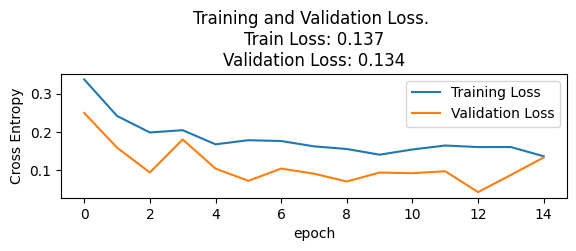

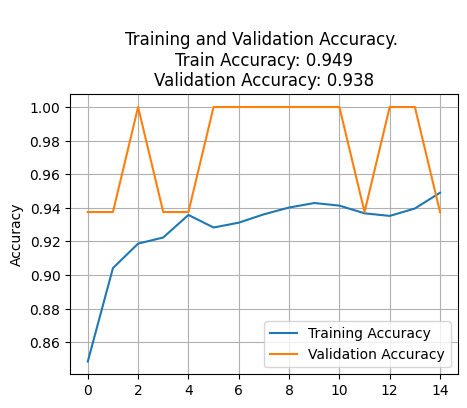

In [ ]:
plot_history(history)

In [ ]:
# Unfreeze
layers=len(base_inceeption.layers)
print("Inception base layers = ", layers)
history = fit_model(m_inception, base_inceeption, epochs = NUM_FT_EPOCHS, fine_tune = int(layers/4))


Inception base layers =  780
Unfreezing layers in the base model =  195
Epoch 1/6
163/163 [==============================] - 252s 1s/step - loss: 0.1814 - accuracy: 0.9327 - val_loss: 0.2718 - val_accuracy: 0.8750
Epoch 2/6
163/163 [==============================] - 216s 1s/step - loss: 0.1256 - accuracy: 0.9538 - val_loss: 0.2733 - val_accuracy: 0.8750
Epoch 3/6
163/163 [==============================] - 212s 1s/step - loss: 0.1033 - accuracy: 0.9640 - val_loss: 0.2483 - val_accuracy: 0.8750
Epoch 4/6
163/163 [==============================] - 214s 1s/step - loss: 0.0783 - accuracy: 0.9709 - val_loss: 0.2314 - val_accuracy: 0.8750
Epoch 5/6
163/163 [==============================] - 213s 1s/step - loss: 0.0708 - accuracy: 0.9751 - val_loss: 0.2626 - val_accuracy: 0.8750
Epoch 6/6
163/163 [==============================] - 215s 1s/step - loss: 0.0621 - accuracy: 0.9799 - val_loss: 0.2249 - val_accuracy: 0.8750


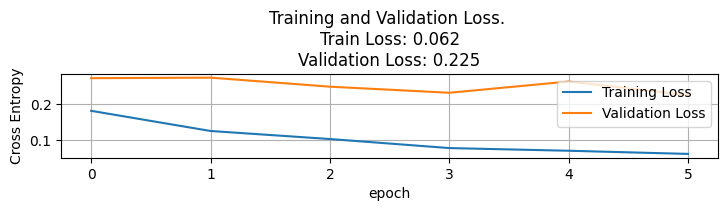

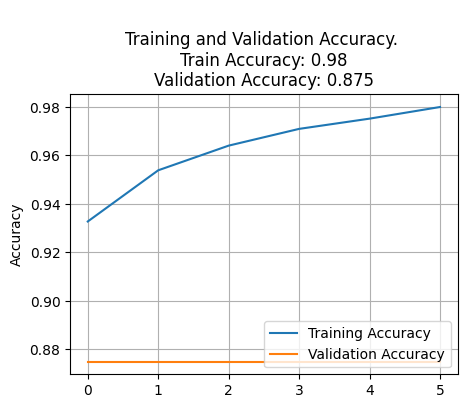

In [ ]:
plot_history(history)

In [ ]:
auc_score=m_inception.evaluate(test_data_gen)

print(auc_score)
print("Accuracy: {:.2f}%".format(auc_score[1] * 100))
print("Loss: {:.3f}".format(auc_score[0]))


20/20 [==============================] - 232s 12s/step - loss: 0.3447 - accuracy: 0.8942
[0.34466323256492615, 0.8942307829856873]
Accuracy: 89.42%
Loss: 0.345


In [ ]:
test_data_gen.reset()
inception_predictions = m_inception.predict(test_data_gen)
incept_prediction_classes = np.argmax(inception_predictions, axis=1)

20/20 [==============================] - 13s 476ms/step


In [ ]:
fpr_inception, tpr_inception, thresholds_inception = roc_curve(test_data_gen.classes, inception_predictions[:,1])
auc_inception = auc(fpr_inception, tpr_inception)

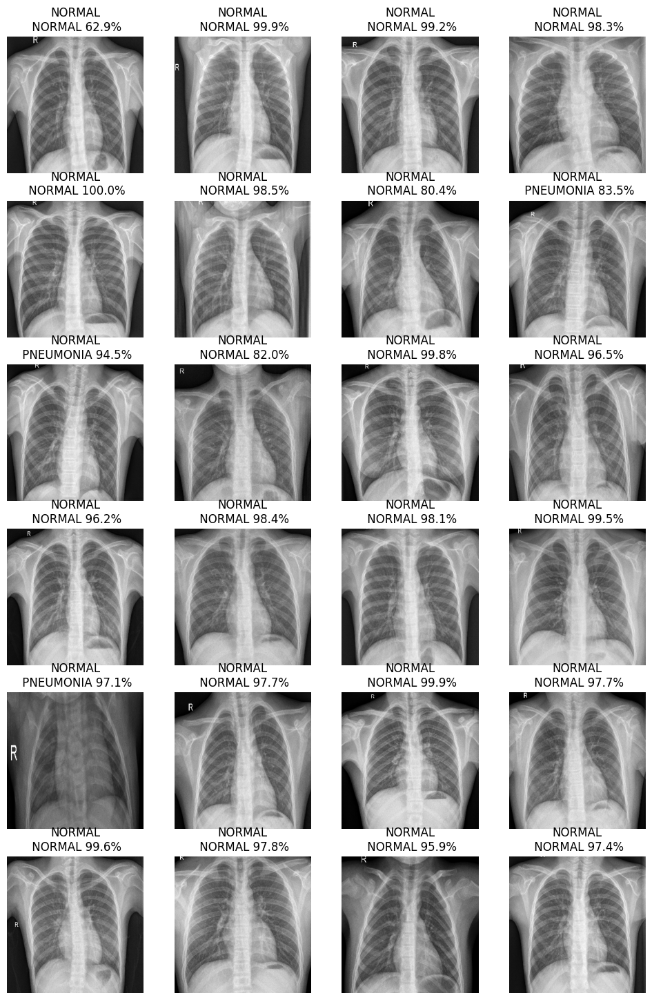

In [ ]:
test_data_gen.reset()
x, y = next(test_data_gen)
draw_img(x, y, inception_predictions)

<ipython-input-28-ebfeacd059f4>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  j_et = cm.get_cmap("jet")


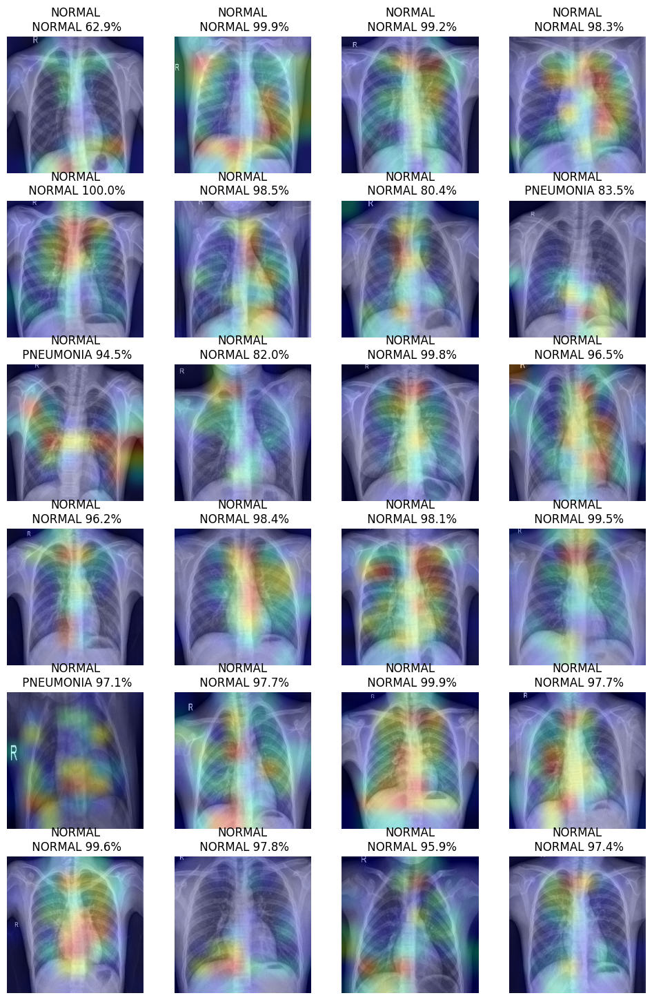

In [ ]:
last_conv_layer_name = "conv_7b_ac"
heatmap_list =[]
for img in x:
    heatmap = grad_hm(img, m_inception, last_conv_layer_name)
    heatmap_list.append(heatmap)

draw_img(heatmap_list, y, inception_predictions)

In [ ]:
# load the VGG16 architecture with imagenet weights as base
base_vgg16 = tf.keras.applications.vgg16.VGG16(include_top = False, weights = 'imagenet', input_shape = (IMG_HEIGHT, IMG_WIDTH, 3))
m_vgg16=create_model(base_vgg16)
history = fit_model(m_vgg16, base_vgg16, epochs = NUM_T_EPOCHS)

58889256/58889256 [==============================] - 2s 0us/step
Unfreezing layers in the base model =  0
Epoch 1/15
163/163 [==============================] - 209s 1s/step - loss: 0.4129 - accuracy: 0.8010 - val_loss: 0.4254 - val_accuracy: 0.8125
Epoch 2/15
163/163 [==============================] - 199s 1s/step - loss: 0.2311 - accuracy: 0.9074 - val_loss: 0.3287 - val_accuracy: 0.8125
Epoch 3/15
163/163 [==============================] - 200s 1s/step - loss: 0.2033 - accuracy: 0.9212 - val_loss: 0.3473 - val_accuracy: 0.8750
Epoch 4/15
163/163 [==============================] - 199s 1s/step - loss: 0.1888 - accuracy: 0.9287 - val_loss: 0.2791 - val_accuracy: 0.8750
Epoch 5/15
163/163 [==============================] - 200s 1s/step - loss: 0.1839 - accuracy: 0.9298 - val_loss: 0.2879 - val_accuracy: 0.8750
Epoch 6/15
163/163 [==============================] - 199s 1s/step - loss: 0.1688 - accuracy: 0.9354 - val_loss: 0.2632 - val_accuracy: 0.8750
Epoch 7/15
163/163 [================

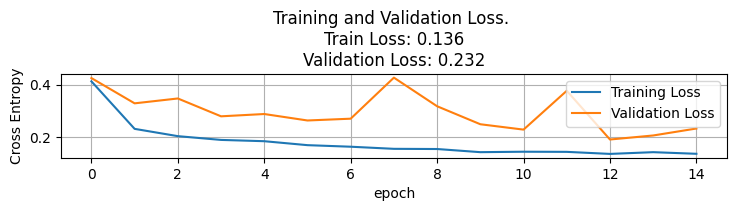

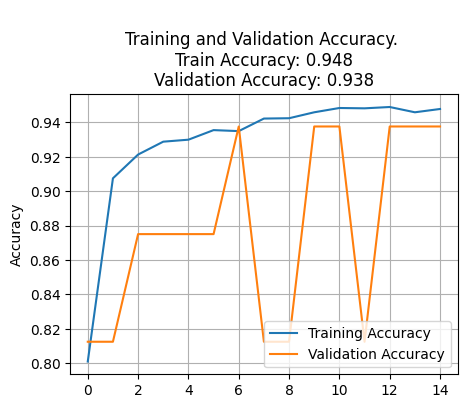

In [ ]:
plot_history(history)

In [ ]:
# Unfreeze
layers = len(base_vgg16.layers)
print("VGG16 base layers = ", layers)

history = fit_model(m_vgg16, base_vgg16, epochs = NUM_FT_EPOCHS, fine_tune = int(layers/4))


VGG16 base layers =  19
Unfreezing layers in the base model =  4
Epoch 1/6
163/163 [==============================] - 202s 1s/step - loss: 0.1164 - accuracy: 0.9592 - val_loss: 0.1988 - val_accuracy: 0.9375
Epoch 2/6
163/163 [==============================] - 199s 1s/step - loss: 0.0877 - accuracy: 0.9668 - val_loss: 0.0598 - val_accuracy: 1.0000
Epoch 3/6
163/163 [==============================] - 203s 1s/step - loss: 0.0618 - accuracy: 0.9783 - val_loss: 0.0472 - val_accuracy: 1.0000
Epoch 4/6
163/163 [==============================] - 202s 1s/step - loss: 0.0510 - accuracy: 0.9806 - val_loss: 0.0738 - val_accuracy: 1.0000
Epoch 5/6
163/163 [==============================] - 200s 1s/step - loss: 0.0375 - accuracy: 0.9854 - val_loss: 0.2120 - val_accuracy: 0.8750
Epoch 6/6
163/163 [==============================] - 201s 1s/step - loss: 0.0433 - accuracy: 0.9856 - val_loss: 0.2165 - val_accuracy: 0.8750


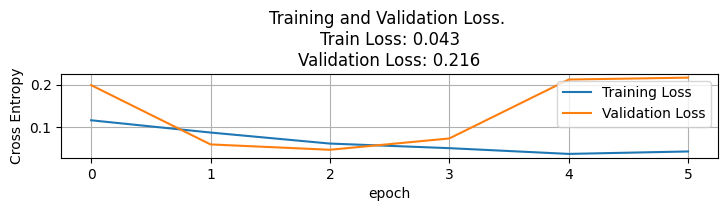

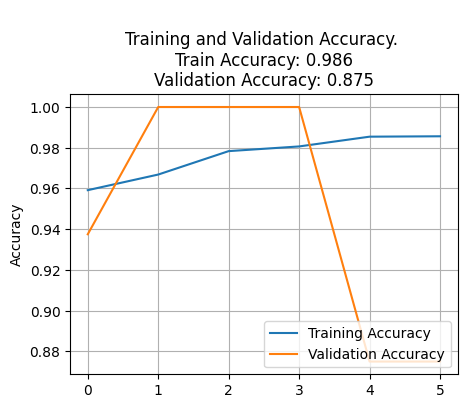

In [ ]:
plot_history(history)

In [ ]:
auc_score = m_vgg16.evaluate(test_data_gen)
print(auc_score)
print("Accuracy: {:.2f}%".format(auc_score[1] * 100))
print("Loss: {:.3f}".format(auc_score[0]))

20/20 [==============================] - 9s 438ms/step - loss: 0.5353 - accuracy: 0.8558
[0.5353474617004395, 0.8557692170143127]
Accuracy: 85.58%
Loss: 0.535


In [ ]:
# computation for confusion matrix
test_data_gen.reset()

vgg16_test_preds = m_vgg16.predict(test_data_gen)
vgg16_test_pred_classes = np.argmax(vgg16_test_preds, axis=1)

20/20 [==============================] - 9s 444ms/step


In [ ]:
fpr_vgg16, tpr_vgg16, thresholds_vgg16 = roc_curve(test_data_gen.classes, vgg16_test_preds[:,1])
auc_vgg16 = auc(fpr_vgg16, tpr_vgg16)

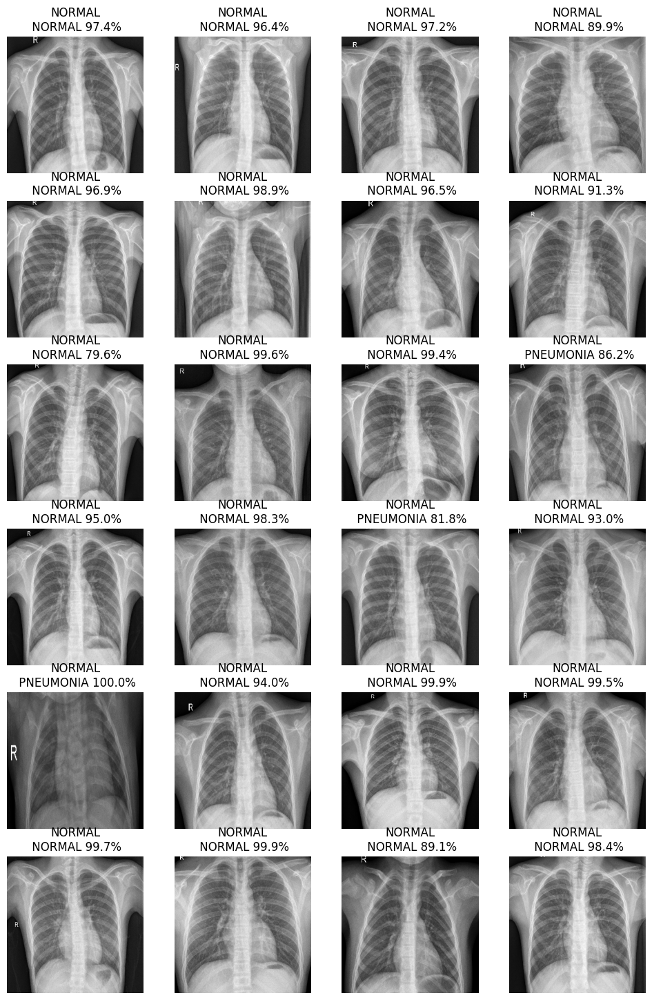

In [ ]:
test_data_gen.reset()
x,y = next(test_data_gen)
draw_img(x, y, vgg16_test_preds)


<ipython-input-28-ebfeacd059f4>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  j_et = cm.get_cmap("jet")


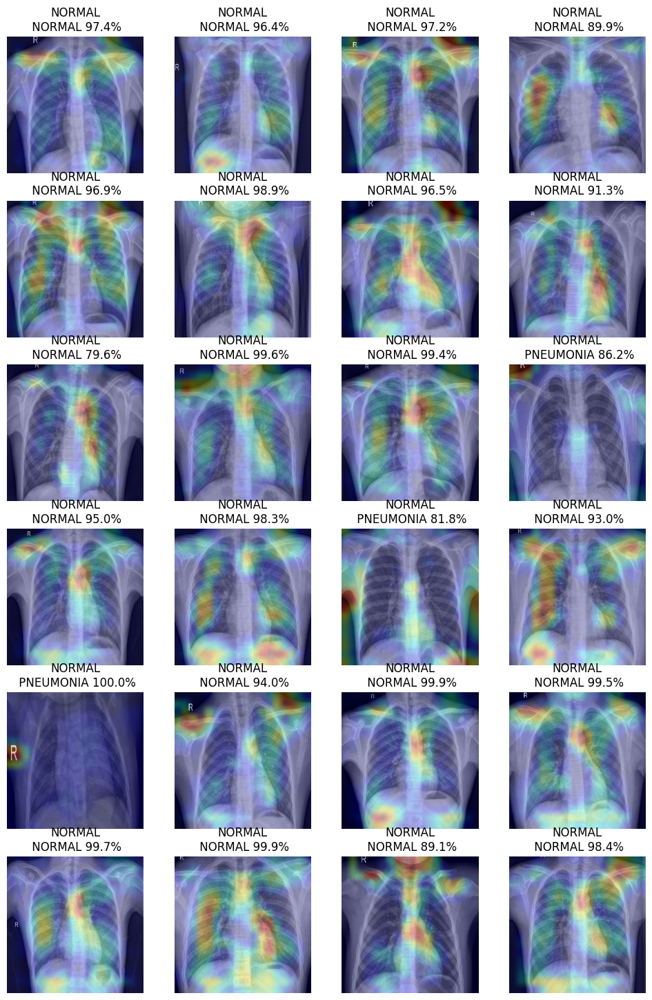

In [ ]:
last_conv_layer_name = "block5_conv3"

heatmap_list =[]

for img in x:
    heatmap = grad_hm(img, m_vgg16, last_conv_layer_name)
    heatmap_list.append(heatmap)

draw_img(heatmap_list, y, vgg16_test_preds)

In [ ]:
#xception
xception_base_model = tf.keras.applications.xception.Xception(
                                 include_top = False,
                                 weights = 'imagenet',
                                 input_shape = (IMG_HEIGHT, IMG_WIDTH, 3)
                                 )

xception_model = create_model(xception_base_model)

history = fit_model(xception_model, xception_base_model, epochs = NUM_T_EPOCHS)

Unfreezing layers in the base model =  0
Epoch 1/15
163/163 [==============================] - 197s 1s/step - loss: 0.2338 - accuracy: 0.8992 - val_loss: 0.2587 - val_accuracy: 0.8125
Epoch 2/15
163/163 [==============================] - 193s 1s/step - loss: 0.1506 - accuracy: 0.9396 - val_loss: 0.0574 - val_accuracy: 1.0000
Epoch 3/15
163/163 [==============================] - 194s 1s/step - loss: 0.1391 - accuracy: 0.9477 - val_loss: 0.1005 - val_accuracy: 1.0000
Epoch 4/15
163/163 [==============================] - 197s 1s/step - loss: 0.1210 - accuracy: 0.9563 - val_loss: 0.0860 - val_accuracy: 1.0000
Epoch 5/15
163/163 [==============================] - 196s 1s/step - loss: 0.1258 - accuracy: 0.9488 - val_loss: 0.0737 - val_accuracy: 1.0000
Epoch 6/15
163/163 [==============================] - 196s 1s/step - loss: 0.1050 - accuracy: 0.9571 - val_loss: 0.0619 - val_accuracy: 1.0000
Epoch 7/15
163/163 [==============================] - 198s 1s/step - loss: 0.1113 - accuracy: 0.9571 

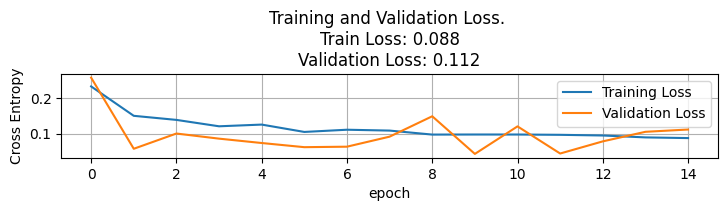

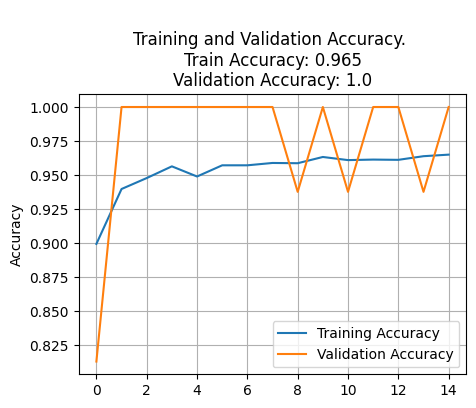

In [ ]:
plot_history(history)

In [ ]:
# Unfreeze
layers = len(xception_base_model.layers)
print("xception base layers = ", layers)

history = fit_model(xception_model, xception_base_model, epochs = NUM_FT_EPOCHS, fine_tune = int(layers/4))

xception base layers =  132
Unfreezing layers in the base model =  33
Epoch 1/6
163/163 [==============================] - 212s 1s/step - loss: 0.1595 - accuracy: 0.9446 - val_loss: 0.0849 - val_accuracy: 1.0000
Epoch 2/6
163/163 [==============================] - 203s 1s/step - loss: 0.1156 - accuracy: 0.9555 - val_loss: 0.1565 - val_accuracy: 0.8750
Epoch 3/6
163/163 [==============================] - 200s 1s/step - loss: 0.0920 - accuracy: 0.9601 - val_loss: 0.0606 - val_accuracy: 1.0000
Epoch 4/6
163/163 [==============================] - 201s 1s/step - loss: 0.0878 - accuracy: 0.9653 - val_loss: 0.0436 - val_accuracy: 1.0000
Epoch 5/6
163/163 [==============================] - 204s 1s/step - loss: 0.0648 - accuracy: 0.9741 - val_loss: 0.0703 - val_accuracy: 1.0000
Epoch 6/6
163/163 [==============================] - 205s 1s/step - loss: 0.0631 - accuracy: 0.9747 - val_loss: 0.0234 - val_accuracy: 1.0000


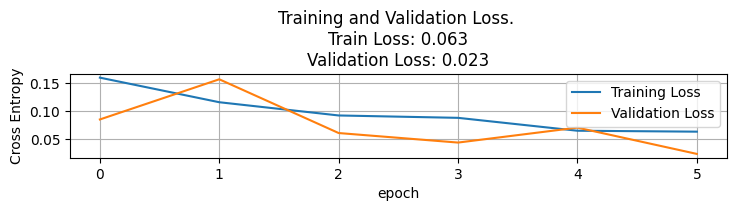

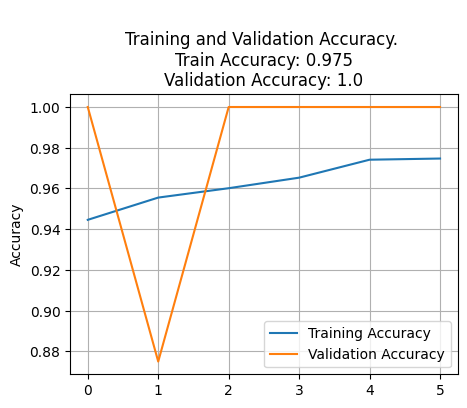

In [ ]:
plot_history(history)

In [ ]:
auc_score = xception_model.evaluate(test_data_gen)

print(auc_score)
print("Accuracy: {:.2f}%".format(auc_score[1] * 100))
print("Loss: {:.3f}".format(auc_score[0]))

20/20 [==============================] - 8s 376ms/step - loss: 0.4545 - accuracy: 0.8910
[0.4545351266860962, 0.8910256624221802]
Accuracy: 89.10%
Loss: 0.455


In [ ]:
# computation for the confusion matrix
test_data_gen.reset()

xception_test_preds = xception_model.predict(test_data_gen)
xception_test_pred_classes = np.argmax(xception_test_preds, axis = 1)

20/20 [==============================] - 9s 373ms/step


In [ ]:
fpr_xception, tpr_xception, thresholds_xception = roc_curve(test_data_gen.classes, xception_test_preds[:,1])
auc_xception = auc(fpr_xception, tpr_xception)

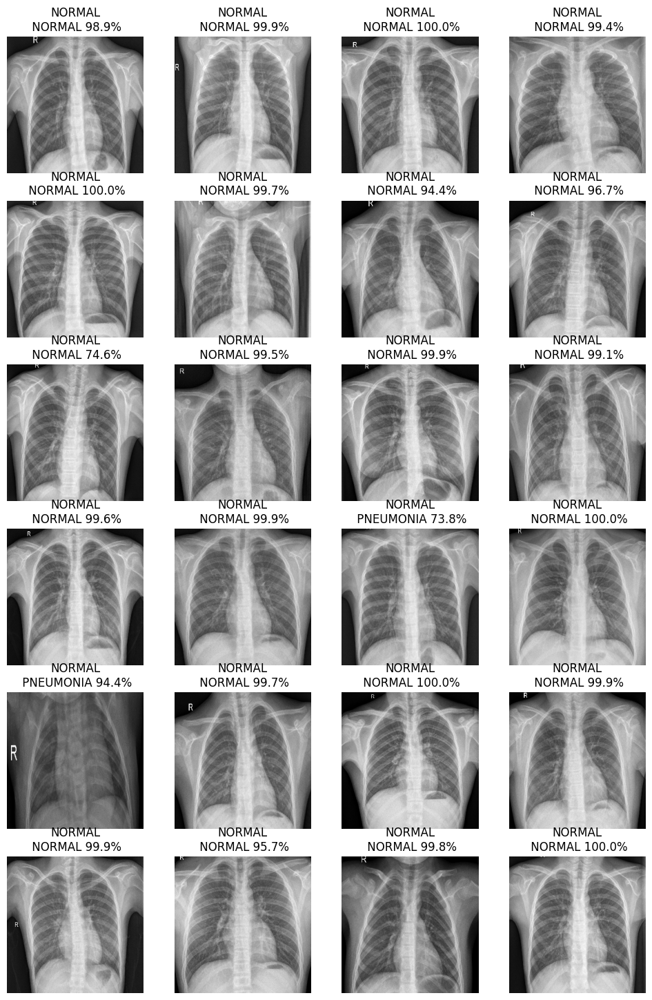

In [ ]:
test_data_gen.reset()
x, y = next(test_data_gen)
draw_img(x, y, xception_test_preds)

<ipython-input-28-ebfeacd059f4>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  j_et = cm.get_cmap("jet")


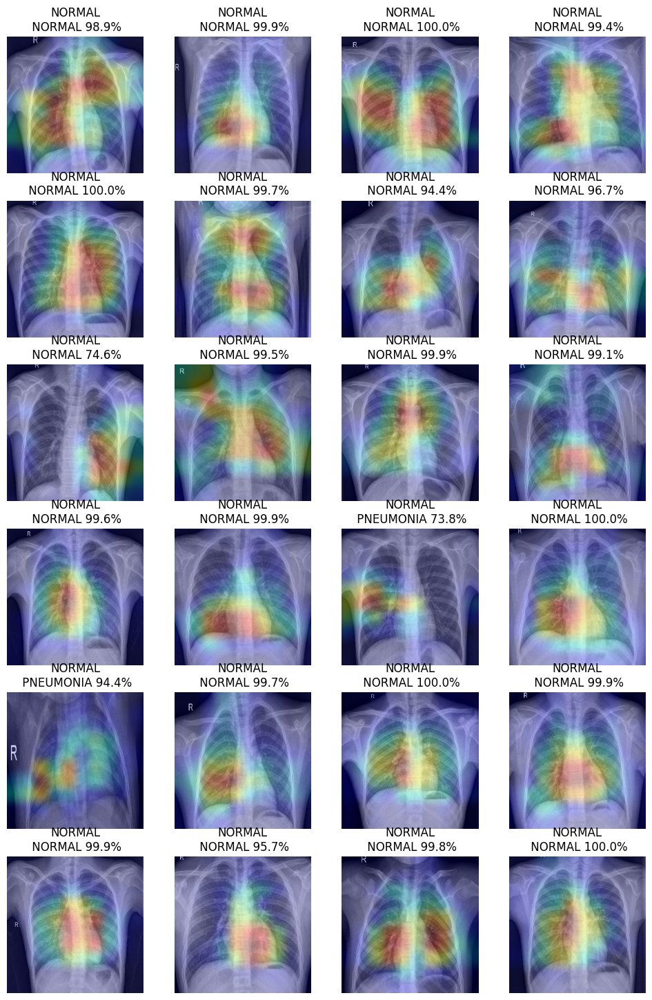

In [ ]:
last_conv_layer_name = "block14_sepconv2_act"

heatmap_list = []

for img in x:
    heatmap = grad_hm(img, xception_model, last_conv_layer_name)
    heatmap_list.append(heatmap)

draw_img(heatmap_list, y, xception_test_preds)

In [ ]:
#densenet

from tensorflow.keras.applications import DenseNet121

densenet_base_model = DenseNet121(
    include_top=False,
    weights='imagenet',
    input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)
)


29084464/29084464 [==============================] - 2s 0us/step


In [ ]:
densenet_model = create_model(densenet_base_model)
history = fit_model(densenet_model, densenet_base_model, epochs=NUM_T_EPOCHS)


Unfreezing layers in the base model =  0
Epoch 1/15
163/163 [==============================] - 205s 1s/step - loss: 0.2926 - accuracy: 0.8648 - val_loss: 0.2587 - val_accuracy: 0.8750
Epoch 2/15
163/163 [==============================] - 191s 1s/step - loss: 0.1745 - accuracy: 0.9390 - val_loss: 0.1682 - val_accuracy: 0.8750
Epoch 3/15
163/163 [==============================] - 191s 1s/step - loss: 0.1650 - accuracy: 0.9375 - val_loss: 0.0982 - val_accuracy: 0.9375
Epoch 4/15
163/163 [==============================] - 192s 1s/step - loss: 0.1414 - accuracy: 0.9427 - val_loss: 0.1008 - val_accuracy: 1.0000
Epoch 5/15
163/163 [==============================] - 194s 1s/step - loss: 0.1373 - accuracy: 0.9456 - val_loss: 0.3720 - val_accuracy: 0.8750
Epoch 6/15
163/163 [==============================] - 194s 1s/step - loss: 0.1309 - accuracy: 0.9502 - val_loss: 0.1132 - val_accuracy: 1.0000
Epoch 7/15
163/163 [==============================] - 195s 1s/step - loss: 0.1298 - accuracy: 0.9471 

In [ ]:
layers = len(densenet_base_model.layers)
history = fit_model(
    densenet_model,
    densenet_base_model,
    epochs=NUM_FT_EPOCHS,
    fine_tune=int(layers / 4)
)


Unfreezing layers in the base model =  106
Epoch 1/6
163/163 [==============================] - 220s 1s/step - loss: 0.4903 - accuracy: 0.9304 - val_loss: 0.2012 - val_accuracy: 0.9375
Epoch 2/6
163/163 [==============================] - 188s 1s/step - loss: 0.2069 - accuracy: 0.9540 - val_loss: 0.1132 - val_accuracy: 0.9375
Epoch 3/6
163/163 [==============================] - 190s 1s/step - loss: 0.1595 - accuracy: 0.9555 - val_loss: 0.0502 - val_accuracy: 1.0000
Epoch 4/6
163/163 [==============================] - 189s 1s/step - loss: 0.1301 - accuracy: 0.9586 - val_loss: 0.0315 - val_accuracy: 1.0000
Epoch 5/6
163/163 [==============================] - 187s 1s/step - loss: 0.1141 - accuracy: 0.9594 - val_loss: 0.0284 - val_accuracy: 1.0000
Epoch 6/6
163/163 [==============================] - 189s 1s/step - loss: 0.0925 - accuracy: 0.9640 - val_loss: 0.0247 - val_accuracy: 1.0000


In [ ]:
auc_score = densenet_model.evaluate(test_data_gen)
print(auc_score)
print("Accuracy: {:.2f}%".format(auc_score[1] * 100))
print("Loss: {:.3f}".format(auc_score[0]))


20/20 [==============================] - 8s 380ms/step - loss: 0.3497 - accuracy: 0.9038
[0.3496541380882263, 0.9038461446762085]
Accuracy: 90.38%
Loss: 0.350


In [ ]:
test_data_gen.reset()

densenet_test_preds = densenet_model.predict(test_data_gen)
densenet_test_pred_classes = np.argmax(densenet_test_preds, axis = 1)

20/20 [==============================] - 12s 489ms/step


In [ ]:
fpr_densenet, tpr_densenet, thresholds_densenet = roc_curve(test_data_gen.classes, densenet_test_preds[:,1])
auc_densenet = auc(fpr_densenet, tpr_densenet)

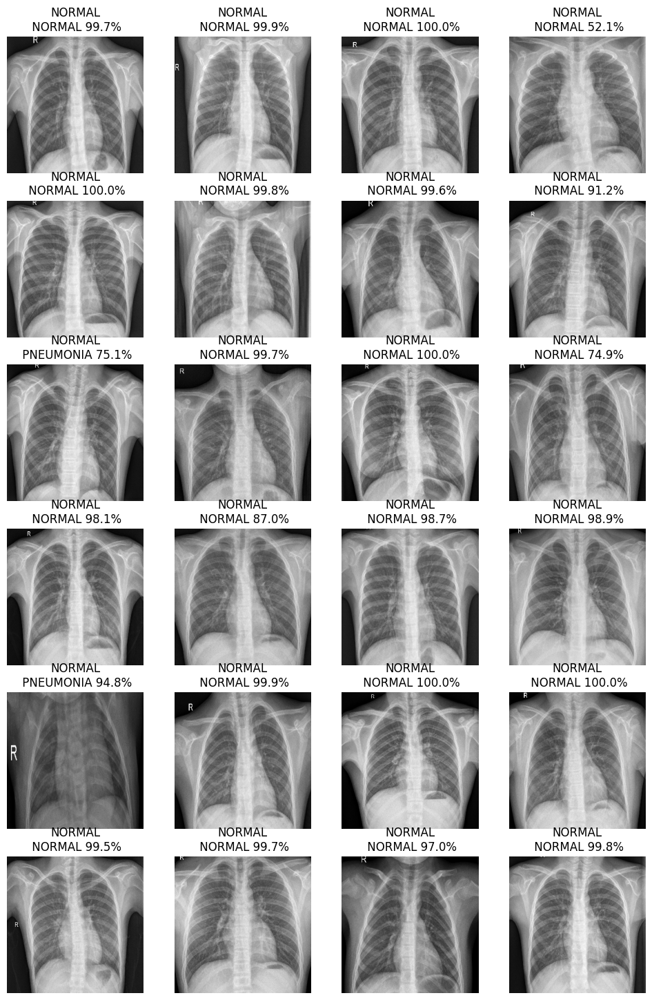

In [ ]:
test_data_gen.reset()
x, y = next(test_data_gen)
draw_img(x, y, densenet_test_preds)

<ipython-input-28-ebfeacd059f4>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  j_et = cm.get_cmap("jet")


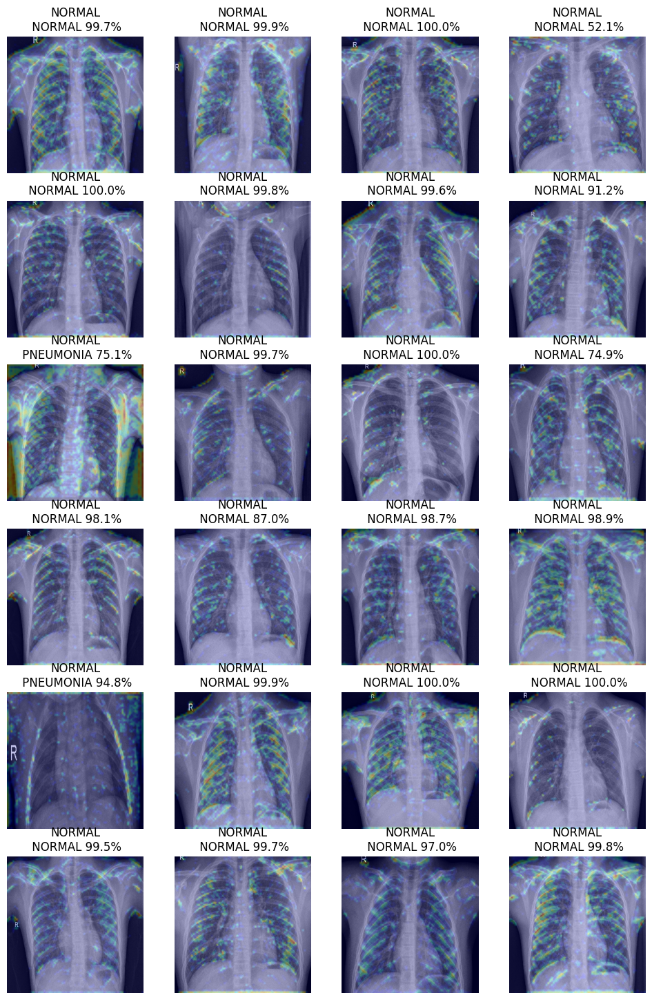

In [ ]:
last_conv_layer_name = "pool2_conv"

heatmap_list = []

for img in x:
    heatmap = grad_hm(img, densenet_model, last_conv_layer_name)
    heatmap_list.append(heatmap)

draw_img(heatmap_list, y, densenet_test_preds)

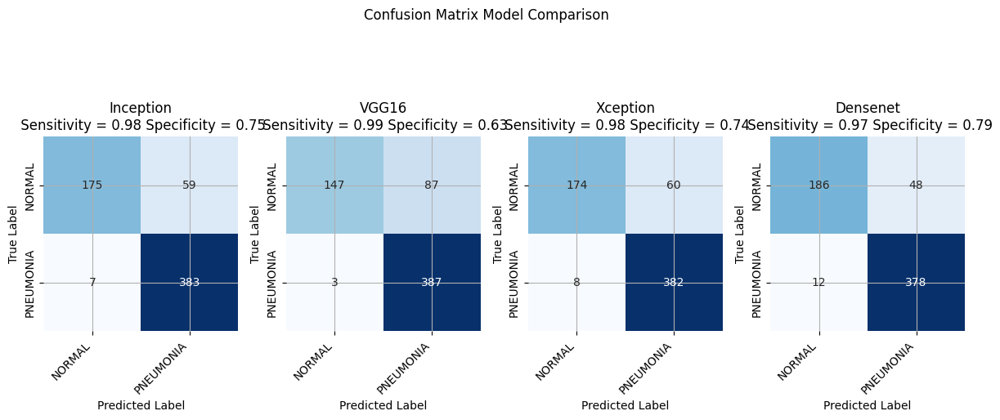

In [ ]:
# Display confusion matrix
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(12, 8))

true_classes = test_data_gen.classes

spot_hm(true_classes, incept_prediction_classes, class_names, ax1, title = "Inception")
spot_hm(true_classes, vgg16_test_pred_classes, class_names, ax2, title = "VGG16")
spot_hm(true_classes, xception_test_pred_classes, class_names, ax3, title = "Xception")
spot_hm(true_classes, densenet_test_pred_classes, class_names, ax4, title = "Densenet")

fig.suptitle("Confusion Matrix Model Comparison", fontsize = 12)
fig.tight_layout()
fig.subplots_adjust(top=1.25)
plt.show()

In [ ]:
#ensemble
ensemble_preds = np.add(np.add(inception_predictions, vgg16_test_preds),densenet_test_preds, xception_test_preds)/4.0

In [ ]:
ensemble_test_pred_classes = np.argmax(ensemble_preds, axis = 1)

Ensemble Accuracy: 90.54%


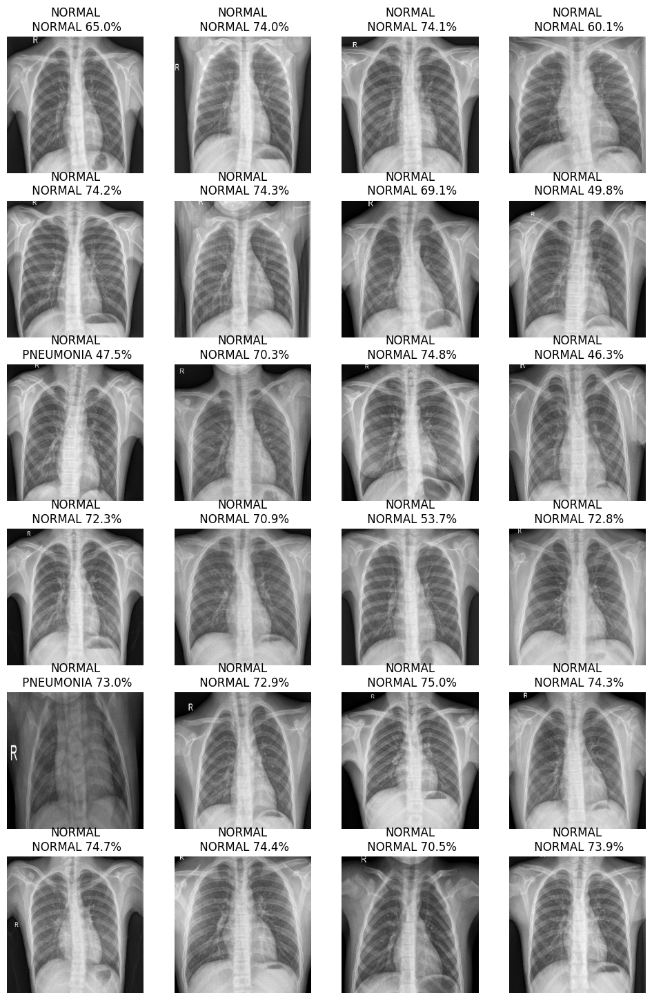

In [ ]:
test_data_gen.reset()
x, y = next(test_data_gen)
draw_img(x, y, ensemble_preds)

ensemble_accuracy = np.mean(ensemble_test_pred_classes == test_data_gen.classes)
print("Ensemble Accuracy: {:.2f}%".format(ensemble_accuracy * 100))



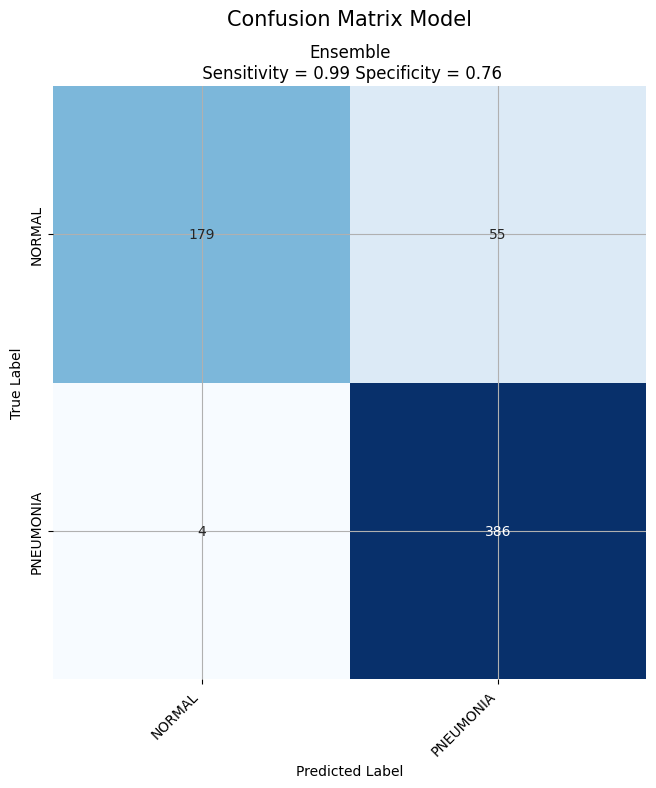

In [ ]:
#  confusion matrix
fig, (ax1) = plt.subplots(1, 1, figsize=(15, 8))

true_classes = test_data_gen.classes

spot_hm(true_classes, ensemble_test_pred_classes, class_names, ax1, title = "Ensemble")

fig.suptitle("Confusion Matrix Model", fontsize = 15)
fig.tight_layout()
plt.show()

In [ ]:
fpr_ensemble, tpr_ensemble, thresholds_ensemble = roc_curve(test_data_gen.classes, ensemble_preds[:,1])
auc_ensemble = auc(fpr_ensemble, tpr_ensemble)

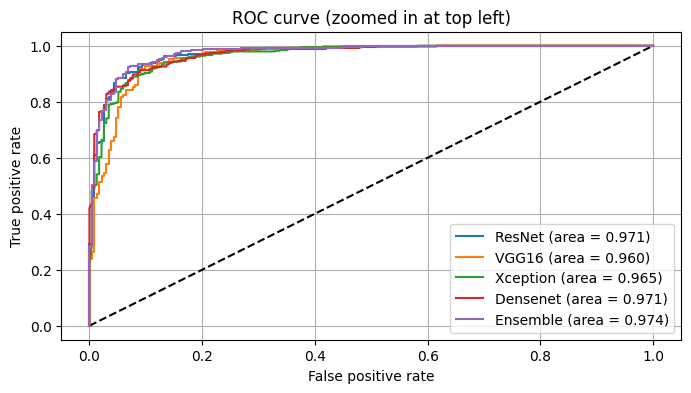

In [ ]:
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_inception, tpr_inception, label='ResNet (area = {:.3f})'.format(auc_inception))
plt.plot(fpr_vgg16, tpr_vgg16, label='VGG16 (area = {:.3f})'.format(auc_vgg16))
plt.plot(fpr_xception, tpr_xception, label='Xception (area = {:.3f})'.format(auc_xception))
plt.plot(fpr_densenet, tpr_densenet, label='Densenet (area = {:.3f})'.format(auc_densenet))
plt.plot(fpr_ensemble, tpr_ensemble, label='Ensemble (area = {:.3f})'.format(auc_ensemble))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve (zoomed in at top left)')
plt.legend(loc='best')
plt.show()